<a href="https://colab.research.google.com/github/tigerjk726/Bumjoong/blob/main/Typhoon_Phase4_ANN(new_data_2023_04_08).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from statistics import mean
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import LeaveOneOut, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

cv = LeaveOneOut()

In [2]:
from google.colab import drive
drive.mount('/content/drive')   
%cd /content/drive/My Drive/8.Colab Notebooks/2023.02.09 Typhoon2/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/8.Colab Notebooks/2023.02.09 Typhoon2


In [3]:
import os
directory = 'path'
for filename in os.listdir(directory):
    # Check if the file has a .txt extension
    if filename.endswith('.txt'):
        # Print the file name
        print(filename)

AAO_Reanalysis.txt
AMO_Reanalysis.txt
AO_msl_Reanalysis.txt
EMI_Reanalysis.txt
GMT_Reanalysis.txt
NINO3_Reanalysis.txt
NINO4_Reanalysis.txt
NINO34_Reanalysis.txt
PDO_Reanalysis.txt
PNA_Reanalysis.txt
QBO_Reanalysis.txt


In [4]:
import pandas as pd
import os
from sklearn.preprocessing import StandardScaler
import datetime

scaler = StandardScaler()

directory = 'path'

df_list = []

# Loop through all files in the directory
for filename in os.listdir(directory):
  if filename.endswith(".txt"):
      filepath = os.path.join(directory, filename)
      with open(filepath) as f:
          lines = [line.split() for line in f]
      data = []
      for line in lines:
          year = int(line[0])
          values = [float(x) for x in line[1:]]
          row_dict = {'year': year}
          for i, value in enumerate(values):  
             month = i + 1
             month_name = pd.Timestamp(year=2000, month=month, day=1).strftime('%B').lower()
             month_name = datetime.datetime.strptime(month_name, "%B").month
             row_dict[month_name] = value
          data.append(row_dict)
    # create the DataFrame
      df = pd.DataFrame(data)
      df = df.melt(id_vars=['year'], var_name='month', value_name=filename.replace('.txt', ''))
      df = df.sort_values(['year', 'month'])
      column_name = filename.replace('.txt', '')
      df[column_name] = scaler.fit_transform(df[column_name].values.reshape(-1, 1))
      df_list.append(df)

# Concatenate all DataFrames in the list into a single DataFrame
rawdata_df = pd.concat(df_list, ignore_index=True)

# Group by year and month and aggregate values
rawdata_df = rawdata_df.groupby(['year', 'month']).mean().reset_index()

# Fill missing values with 0 if needed
# rawdata_df = rawdata_df.fillna(0)

rawdata_df

,year,month,AAO_Reanalysis,AMO_Reanalysis,AO_msl_Reanalysis,EMI_Reanalysis,GMT_Reanalysis,NINO3_Reanalysis,NINO4_Reanalysis,NINO34_Reanalysis,PDO_Reanalysis,PNA_Reanalysis,QBO_Reanalysis
0,1854,1,NaN,1.409099,NaN,-0.315283,NaN,0.064751,-0.393332,-0.436104,0.106996,NaN,NaN
1,1854,2,NaN,2.094916,NaN,0.540181,NaN,-0.033065,0.002007,-0.442982,0.061996,NaN,NaN
2,1854,3,NaN,1.579036,NaN,0.979474,NaN,-0.085417,0.413319,0.017863,0.234996,NaN,NaN
3,1854,4,NaN,1.142056,NaN,0.931131,NaN,0.073017,0.471222,0.353523,0.155996,NaN,NaN
4,1854,5,NaN,0.237749,NaN,0.584321,NaN,0.210786,0.680872,0.478708,-0.220005,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,2021,8,-0.124464,1.032811,0.104003,-0.523369,1.667982,-0.615827,-0.267543,-0.631447,-0.385005,-0.081772,-0.619857
2012,2021,9,-1.726965,1.536552,-0.612989,-0.653685,1.933900,-0.650269,-0.782682,-0.702981,-1.249005,-0.040148,-0.827774
2013,2021,10,-0.894742,1.639728,-0.526990,-0.840752,2.069276,-0.987803,-1.074194,-1.079911,-2.306006,-0.392468,-1.028265
2014,2021,11,-1.793560,1.621521,-0.065995,-0.670500,1.914560,-1.337736,-1.082181,-1.161075,-2.050005,0.851803,-1.168213


In [ ]:
import pandas as pd
import os
from sklearn.preprocessing import StandardScaler
import datetime

scaler = StandardScaler()

directory2 = 'country'

df2_list = []

# Loop through all files in the directory2
for filename in os.listdir(directory2):
  if filename.endswith(".txt"):
      filepath = os.path.join(directory2, filename)
      with open(filepath) as f:
          lines = [line.split() for line in f]
      data2 = []
      for line in lines:
          year = int(line[0])
          values = [float(x) if x != '-9' else 0 for x in line[1:]]
          row_dict = {'year': year}
          for i, value in enumerate(values):  
             month = i + 1
             month_name = pd.Timestamp(year=2000, month=month, day=1).strftime('%B').lower()
             month_name = datetime.datetime.strptime(month_name, "%B").month
             row_dict[month_name] = value
          data2.append(row_dict)
    # create the DataFrame
      df2 = pd.DataFrame(data2)
      df2 = df2.melt(id_vars=['year'], var_name='month', value_name=filename.replace('.txt', ''))
      df2 = df2.sort_values(['year', 'month'])
      column_name = filename.replace('.txt', '')
      #df2[column_name] = scaler.fit_transform(df2[column_name].values.reshape(-1, 1))
      df2_list.append(df2)

# Concatenate all DataFrames in the list into a single DataFrame
result_df = pd.concat(df2_list, ignore_index=True)

# Group by year and month and aggregate values
result_df = result_df.groupby(['year', 'month']).mean().reset_index()

result_df = result_df.rename(columns={'Mexico_TC_freq_NHC-ENP': 'Mexic2_TC_freq_NHC-ENP'})
result_df = result_df.rename(columns={'Mexico_TC_landfall_intensity_NHC-ENP': 'Mexic2_TC_landfall_intensity_NHC-ENP'})
result_df = result_df.rename(columns={'US_TC_freq_NHC-ENP': 'U2_TC_freq_NHC-ENP'})
result_df = result_df.rename(columns={'US_TC_landfall_intensity_NHC-ENP': 'U2_TC_landfall_intensity_NHC-ENP'})
result_df.columns = map(str.lower, result_df.columns)
# Fill missing values with 0 if neederesult# merged_df2 = merged_df2.fillna(0)
pd.options.display.max_columns = None
result_df

,year,month,korea_tc_freq_jtwc-wnp,japan_tc_freq_jtwc-wnp,korea_tc_landfall_intensity_jtwc-wnp,japan_tc_landfall_intensity_jtwc-wnp,taiwan_tc_freq_jtwc-wnp,taiwan_tc_landfall_intensity_jtwc-wnp,china_tc_freq_jtwc-wnp,china_tc_landfall_intensity_jtwc-wnp,vietnam_tc_freq_jtwc-wnp,vietnam_tc_landfall_intensity_jtwc-wnp,phili_tc_freq_jtwc-wnp,phili_tc_landfall_intensity_jtwc-wnp,u2_tc_freq_nhc-enp,u2_tc_landfall_intensity_nhc-enp,mexic2_tc_freq_nhc-enp,mexic2_tc_landfall_intensity_nhc-enp,us_tc_freq_nhc-nat,us_tc_landfall_intensity_nhc-nat,mexico_tc_freq_nhc-nat,mexico_tc_landfall_intensity_nhc-nat,carribean_tc_freq_nhc-nat,carribean_tc_landfall_intensity_nhc-nat,sri_tc_freq_jtwc-nio,sri_tc_landfall_intensity_jtwc-nio,india_tc_freq_jtwc-nio,india_tc_landfall_intensity_jtwc-nio,pakistan_tc_freq_jtwc-nio,pakistan_tc_landfall_intensity_jtwc-nio,bangla_tc_freq_jtwc-nio,bangla_tc_landfall_intensity_jtwc-nio,myanmar_tc_freq_jtwc-nio,myanmar_tc_landfall_intensity_jtwc-nio,madagascar_tc_freq_jtwc-sh,madagascar_tc_landfall_intensity_jtwc-sh,austrailia_tc_freq_jtwc-sh,austrailia_tc_landfall_intensity_jtwc-sh
0,1959,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1959,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1959,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1959,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1959,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,40.0,1.0,25.0,1.0,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,2021,8,1.0,4.0,26.0,32.0,1.0,45.0,1.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,40.0,3.0,64.0,1.0,70.0,3.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
752,2021,9,1.0,1.0,55.0,42.0,1.0,148.0,1.0,105.0,2.0,36.0,2.0,78.0,0.0,0.0,1.0,25.0,3.0,35.0,1.0,35.0,1.0,39.0,0.0,0.0,1.0,40.0,1.0,25.0,0.0,0.0,1.0,25.0,0.0,0.0,0.0,0.0
753,2021,10,0.0,1.0,0.0,78.0,0.0,0.0,2.0,42.0,2.0,36.0,1.0,48.0,0.0,0.0,2.0,67.0,1.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
754,2021,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,25.0,1.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
column_titles = list(result_df.columns)
column_titles.remove('year')
column_titles.remove('month')
column_titles.sort()
column_titles

['austrailia_tc_freq_jtwc-sh',
 'austrailia_tc_landfall_intensity_jtwc-sh',
 'bangla_tc_freq_jtwc-nio',
 'bangla_tc_landfall_intensity_jtwc-nio',
 'carribean_tc_freq_nhc-nat',
 'carribean_tc_landfall_intensity_nhc-nat',
 'china_tc_freq_jtwc-wnp',
 'china_tc_landfall_intensity_jtwc-wnp',
 'india_tc_freq_jtwc-nio',
 'india_tc_landfall_intensity_jtwc-nio',
 'japan_tc_freq_jtwc-wnp',
 'japan_tc_landfall_intensity_jtwc-wnp',
 'korea_tc_freq_jtwc-wnp',
 'korea_tc_landfall_intensity_jtwc-wnp',
 'madagascar_tc_freq_jtwc-sh',
 'madagascar_tc_landfall_intensity_jtwc-sh',
 'mexic2_tc_freq_nhc-enp',
 'mexic2_tc_landfall_intensity_nhc-enp',
 'mexico_tc_freq_nhc-nat',
 'mexico_tc_landfall_intensity_nhc-nat',
 'myanmar_tc_freq_jtwc-nio',
 'myanmar_tc_landfall_intensity_jtwc-nio',
 'pakistan_tc_freq_jtwc-nio',
 'pakistan_tc_landfall_intensity_jtwc-nio',
 'phili_tc_freq_jtwc-wnp',
 'phili_tc_landfall_intensity_jtwc-wnp',
 'sri_tc_freq_jtwc-nio',
 'sri_tc_landfall_intensity_jtwc-nio',
 'taiwan_tc_freq_j

In [ ]:
country_codes = {
    'austrailia': 0,
    'bangla': 1,
    'carribean': 2,
    'china': 3,
    'india': 4,
    'japan': 5,
    'korea': 6,
    'madagascar': 7,
    'mexic2': 8,
    'mexico': 9,
    'myanmar': 10,
    'phili': 11,
    'pakistan': 12,
    'sri': 13,
    'taiwan': 14,
    'u2': 15,
    'us': 16,
    'vietnam': 17,
}

In [ ]:
result_dfs = []

for col in column_titles:

    for key in country_codes.keys():
        if key in col.lower():
            country = country_codes[key]
            break
    else:
        country = None

    # Add the 'country' column to result_df
    result_df['country'] = country
    result_df['name'] = key

    # Check if the selected column name contains 'freq' or 'intensity', and replace the entire column name with either 'freq' or 'intensity' accordingly
    if 'freq' in col.lower():
        new_column_name = 'freq'
    elif 'intensity' in col.lower():
        new_column_name = 'intensity'
    else:
        new_column_name = col

    # Get the years without nan values for the selected country
    years = result_df[result_df[col].notna()]['year'].unique()

    # Filter dataframe A for the selected country and years
    x = rawdata_df[rawdata_df['year'].isin(years)]

    # Filter dataframe B for the selected country and years, and rename the selected column
    y = result_df[['year', 'month', 'country', 'name', col]][result_df[col].notna() & result_df['year'].isin(years)].rename(columns={col: new_column_name})

    xy = pd.merge(x, y, on=['year', 'month'])
    result_dfs.append(xy)

alldfs = pd.concat(result_dfs, ignore_index=True)
alldfs

,year,month,AAO_Reanalysis,AMO_Reanalysis,AO_msl_Reanalysis,EMI_Reanalysis,GMT_Reanalysis,NINO3_Reanalysis,NINO4_Reanalysis,NINO34_Reanalysis,PDO_Reanalysis,PNA_Reanalysis,QBO_Reanalysis,country,name,freq,intensity
0,1991,1,-0.941385,-1.576935,0.694996,2.038820,0.333561,0.103327,1.192017,0.603893,-1.199005,-0.477203,0.926463,0,austrailia,0.0,NaN
1,1991,2,0.626454,-1.285615,-0.228994,2.013598,0.497946,-0.031687,1.148090,0.452571,-0.586005,0.891941,0.949578,0,austrailia,1.0,NaN
2,1991,3,-0.431124,-1.334168,-0.238993,1.540675,-0.038724,-0.143280,0.824631,0.155429,-0.451005,-1.266580,0.838374,0,austrailia,0.0,NaN
3,1991,4,0.497968,-1.965362,1.088992,1.340997,0.377074,0.096438,0.870554,0.422306,-0.950005,0.416234,0.329182,0,austrailia,0.0,NaN
4,1991,5,1.212183,-2.141368,0.525998,1.418766,0.130496,0.422950,1.002334,0.466327,-0.984005,-0.209618,-0.295706,0,austrailia,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24235,2021,8,-0.124464,1.032811,0.104003,-0.523369,1.667982,-0.615827,-0.267543,-0.631447,-0.385005,-0.081772,-0.619857,17,vietnam,NaN,0.0
24236,2021,9,-1.726965,1.536552,-0.612989,-0.653685,1.933900,-0.650269,-0.782682,-0.702981,-1.249005,-0.040148,-0.827774,17,vietnam,NaN,36.0
24237,2021,10,-0.894742,1.639728,-0.526990,-0.840752,2.069276,-0.987803,-1.074194,-1.079911,-2.306006,-0.392468,-1.028265,17,vietnam,NaN,36.0
24238,2021,11,-1.793560,1.621521,-0.065995,-0.670500,1.914560,-1.337736,-1.082181,-1.161075,-2.050005,0.851803,-1.168213,17,vietnam,NaN,0.0


In [ ]:
freqdf = alldfs.iloc[:,0:16]
freqdf = freqdf.dropna().reset_index(drop=True)
freqdf

,year,month,AAO_Reanalysis,AMO_Reanalysis,AO_msl_Reanalysis,EMI_Reanalysis,GMT_Reanalysis,NINO3_Reanalysis,NINO4_Reanalysis,NINO34_Reanalysis,PDO_Reanalysis,PNA_Reanalysis,QBO_Reanalysis,country,name,freq
0,1991,1,-0.941385,-1.576935,0.694996,2.038820,0.333561,0.103327,1.192017,0.603893,-1.199005,-0.477203,0.926463,0,austrailia,0.0
1,1991,2,0.626454,-1.285615,-0.228994,2.013598,0.497946,-0.031687,1.148090,0.452571,-0.586005,0.891941,0.949578,0,austrailia,1.0
2,1991,3,-0.431124,-1.334168,-0.238993,1.540675,-0.038724,-0.143280,0.824631,0.155429,-0.451005,-1.266580,0.838374,0,austrailia,0.0
3,1991,4,0.497968,-1.965362,1.088992,1.340997,0.377074,0.096438,0.870554,0.422306,-0.950005,0.416234,0.329182,0,austrailia,0.0
4,1991,5,1.212183,-2.141368,0.525998,1.418766,0.130496,0.422950,1.002334,0.466327,-0.984005,-0.209618,-0.295706,0,austrailia,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12115,2021,8,-0.124464,1.032811,0.104003,-0.523369,1.667982,-0.615827,-0.267543,-0.631447,-0.385005,-0.081772,-0.619857,17,vietnam,0.0
12116,2021,9,-1.726965,1.536552,-0.612989,-0.653685,1.933900,-0.650269,-0.782682,-0.702981,-1.249005,-0.040148,-0.827774,17,vietnam,2.0
12117,2021,10,-0.894742,1.639728,-0.526990,-0.840752,2.069276,-0.987803,-1.074194,-1.079911,-2.306006,-0.392468,-1.028265,17,vietnam,2.0
12118,2021,11,-1.793560,1.621521,-0.065995,-0.670500,1.914560,-1.337736,-1.082181,-1.161075,-2.050005,0.851803,-1.168213,17,vietnam,0.0


In [ ]:
intendf = alldfs.drop(columns=['freq'])
intendf = intendf.dropna().reset_index(drop=True)
intendf

,year,month,AAO_Reanalysis,AMO_Reanalysis,AO_msl_Reanalysis,EMI_Reanalysis,GMT_Reanalysis,NINO3_Reanalysis,NINO4_Reanalysis,NINO34_Reanalysis,PDO_Reanalysis,PNA_Reanalysis,QBO_Reanalysis,country,name,intensity
0,1991,1,-0.941385,-1.576935,0.694996,2.038820,0.333561,0.103327,1.192017,0.603893,-1.199005,-0.477203,0.926463,0,austrailia,0.0
1,1991,2,0.626454,-1.285615,-0.228994,2.013598,0.497946,-0.031687,1.148090,0.452571,-0.586005,0.891941,0.949578,0,austrailia,30.0
2,1991,3,-0.431124,-1.334168,-0.238993,1.540675,-0.038724,-0.143280,0.824631,0.155429,-0.451005,-1.266580,0.838374,0,austrailia,0.0
3,1991,4,0.497968,-1.965362,1.088992,1.340997,0.377074,0.096438,0.870554,0.422306,-0.950005,0.416234,0.329182,0,austrailia,0.0
4,1991,5,1.212183,-2.141368,0.525998,1.418766,0.130496,0.422950,1.002334,0.466327,-0.984005,-0.209618,-0.295706,0,austrailia,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12115,2021,8,-0.124464,1.032811,0.104003,-0.523369,1.667982,-0.615827,-0.267543,-0.631447,-0.385005,-0.081772,-0.619857,17,vietnam,0.0
12116,2021,9,-1.726965,1.536552,-0.612989,-0.653685,1.933900,-0.650269,-0.782682,-0.702981,-1.249005,-0.040148,-0.827774,17,vietnam,36.0
12117,2021,10,-0.894742,1.639728,-0.526990,-0.840752,2.069276,-0.987803,-1.074194,-1.079911,-2.306006,-0.392468,-1.028265,17,vietnam,36.0
12118,2021,11,-1.793560,1.621521,-0.065995,-0.670500,1.914560,-1.337736,-1.082181,-1.161075,-2.050005,0.851803,-1.168213,17,vietnam,0.0


In [ ]:
# ANN
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Define the neural network model for predicting y1
model_1 = Sequential()
model_1.add(Dense(64, input_dim=13, activation="relu"))
model_1.add(Dense(32, activation="relu"))
model_1.add(Dense(1, activation="linear"))
model_1.compile(loss="mean_squared_error", optimizer="adam")
# Initialize the lists to store the predictions and actual values for y1 and y2

y1_preds = []
y1_actuals = []
y1_test_country = []
y1_test_month = []
y1_test_year = []

# examption : 'myanmar': 10, 'pakistan': 12, 'sri': 13, 'u2': 15,'bangla' : 1
freqdf = freqdf[~freqdf['country'].isin([1, 10, 12, 13, 15])].reset_index(drop=True)

# Loop over each year and perform LOOCV
for year in range(1959, 2022):
    # Split the data into training and test sets based on the year
    freqdf_x1_train = freqdf[freqdf['year'] != year].iloc[:,1:14]
    freqdf_x1_test = freqdf[freqdf['year'] == year].iloc[:,1:14]
    freqdf_y1_train = freqdf[freqdf['year'] != year].iloc[:,[0, 1, 14, 15]]
    freqdf_y1_test = freqdf[freqdf['year'] == year].iloc[:,[0, 1, 14, 15]]

    # Train the model on the training set
    model_1.fit(freqdf_x1_train, freqdf_y1_train.iloc[:,3], epochs=100, batch_size=32, verbose=0)

    # Predict the output for the test set
    y1_pred = model_1.predict(freqdf_x1_test)

    # Add the predictions and actual values to the respective lists
    y1_preds.extend(y1_pred)
    y1_actuals.extend(freqdf_y1_test.iloc[:,3].values)
    y1_test_year.extend(freqdf_y1_test.iloc[:,0].values)
    y1_test_month.extend(freqdf_y1_test.iloc[:,1].values)
    y1_test_country.extend(freqdf_y1_test.iloc[:,2].values)

# Convert predictions to DataFrame and concatenate with country and month columns
y1_pred_df = pd.DataFrame({"year": y1_test_year, "month": y1_test_month, "country": y1_test_country, "y1_pred": np.squeeze(y1_preds),"y1_actual": y1_actuals})
y1_pred_df = y1_pred_df[['year', 'month', 'country', 'y1_pred', 'y1_actual']]

# Save predictions to CSV file
y1_pred_df.to_csv('y_pred_ANN_freq5.csv', index=False)

import pickle

# 모델 저장
with open('model_1.pkl', 'wb') as f:
    pickle.dump(model_1, f)

# 모델 불러오기
with open('model_1.pkl', 'rb') as f:
    model_1_loaded = pickle.load(f)

5/5 [==============================] - 0s 2ms/step


In [ ]:
# ANN
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import pickle


# Define the neural network model for predicting y2
model_2 = Sequential()
model_2.add(Dense(64, input_dim=13, activation="relu"))
model_2.add(Dense(32, activation="relu"))
model_2.add(Dense(1, activation="linear"))
model_2.compile(loss="mean_squared_error", optimizer="adam")
# Initialize the lists to store the predictions and actual values for y2 and y2

y2_preds = []
y2_actuals = []
y2_test_country = []
y2_test_month = []
y2_test_year = []


# examption : 'myanmar': 10, 'pakistan': 12, 'sri': 13, 'u2': 15,'bangla' : 1
intendf = intendf[~intendf['country'].isin([1, 10, 12, 13, 15])].reset_index(drop=True)


# Loop over each year and perform LOOCV
for year in range(1959, 2022):
    # Split the data into training and test sets based on the year
    intendf_x2_train = intendf[intendf['year'] != year].iloc[:,1:14]
    intendf_x2_test = intendf[intendf['year'] == year].iloc[:,1:14]
    intendf_y2_train = intendf[intendf['year'] != year].iloc[:,[0, 1, 14, 15]]
    intendf_y2_test = intendf[intendf['year'] == year].iloc[:,[0, 1, 14, 15]]

    # Train the model on the training set
    model_2.fit(intendf_x2_train, intendf_y2_train.iloc[:,3], epochs=100, batch_size=32, verbose=0)

    # Predict the output for the test set
    y2_pred = model_2.predict(intendf_x2_test)

    # Add the predictions and actual values to the respective lists
    y2_preds.extend(y2_pred)
    y2_actuals.extend(intendf_y2_test.iloc[:,3].values)
    y2_test_year.extend(intendf_y2_test.iloc[:,0].values)
    y2_test_month.extend(intendf_y2_test.iloc[:,1].values)
    y2_test_country.extend(intendf_y2_test.iloc[:,2].values)

# Convert predictions to DataFrame and concatenate with country and month columns
y2_pred_df = pd.DataFrame({"year": y2_test_year, "month": y2_test_month, "country": y2_test_country, "y2_pred": np.squeeze(y2_preds),"y2_actual": y2_actuals})
y2_pred_df = y2_pred_df[['year', 'month', 'country', 'y2_pred', 'y2_actual']]

# Save predictions to CSV file
y2_pred_df.to_csv('y_pred_ANN_inten5.csv', index=False)

import pickle

# 모델 저장
with open('model_2.pkl', 'wb') as f:
    pickle.dump(model_2, f)

# 모델 불러오기
with open('model_2.pkl', 'rb') as f:
    model_2_loaded = pickle.load(f)

5/5 [==============================] - 0s 3ms/step


RMSE for y1: 2.1317069564393094
Correlation for y1: 0.6600743269704712


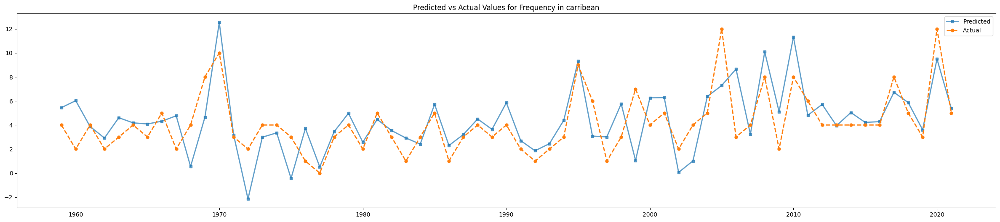

RMSE for y1: 2.1655847777946726
Correlation for y1: 0.6360235780408755


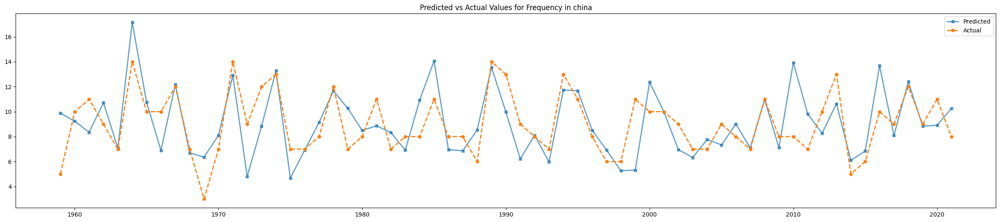

RMSE for y1: 2.019283150180619
Correlation for y1: 0.6164010910993367


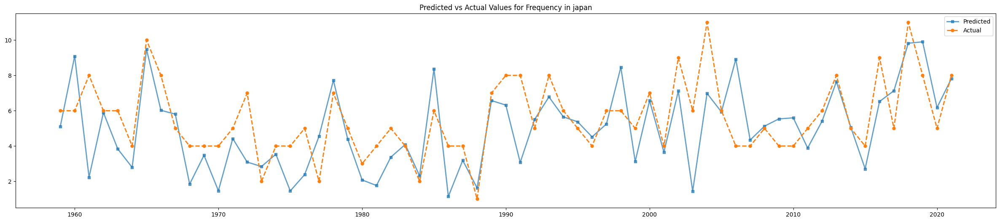

RMSE for y1: 2.6627190540411156
Correlation for y1: 0.3840431875704468


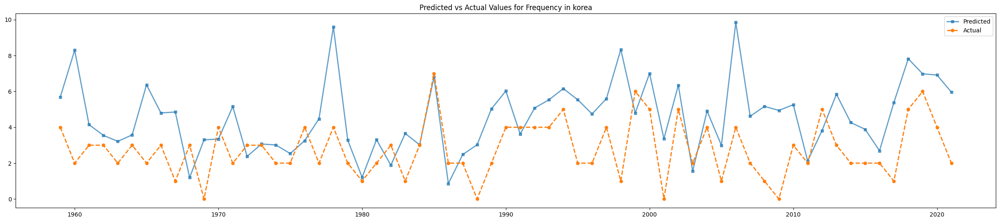

RMSE for y1: 2.3213719543682996
Correlation for y1: 0.4641773059957138


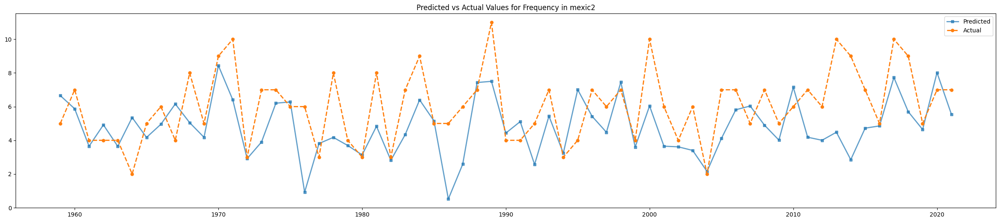

RMSE for y1: 3.1209134054453482
Correlation for y1: 0.6033623978035179


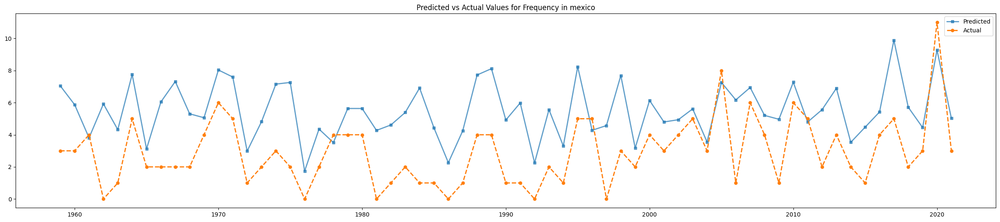

RMSE for y1: 3.1718746629253673
Correlation for y1: 0.4974370833865076


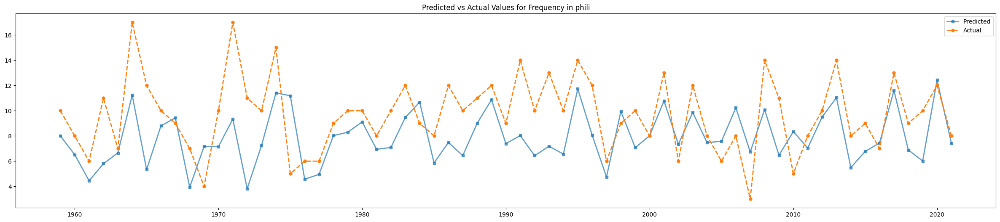

RMSE for y1: 2.1523952343329156
Correlation for y1: 0.3206512855119988


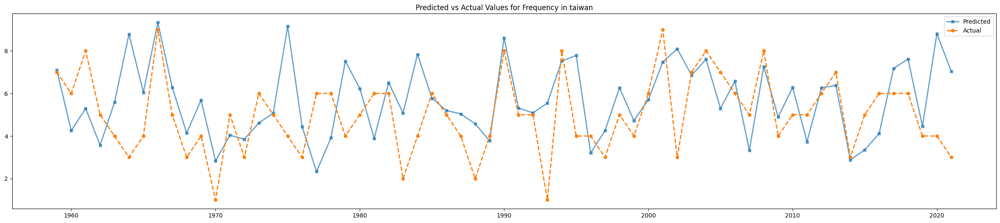

RMSE for y1: 2.12484835440988
Correlation for y1: 0.5806850107707254


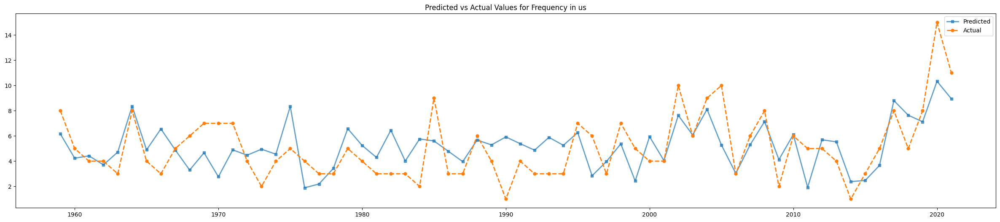

RMSE for y1: 2.596462271393767
Correlation for y1: 0.3161875042611659


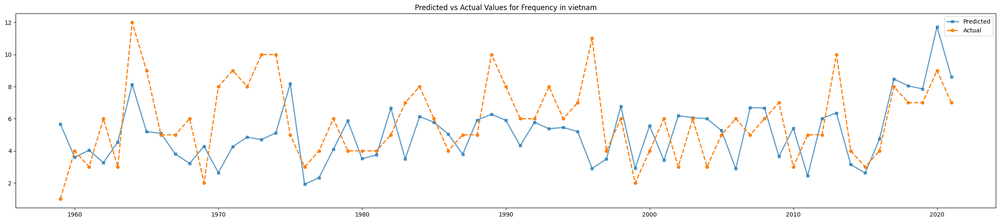

RMSE for y1: 1.7913699950300959
Correlation for y1: 0.5453513414423007


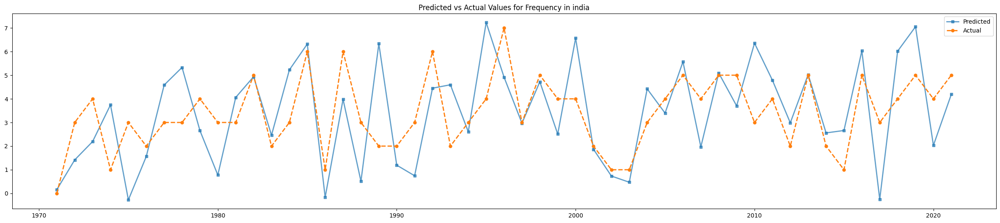

RMSE for y1: 2.989860335118789
Correlation for y1: 0.4668999127377784


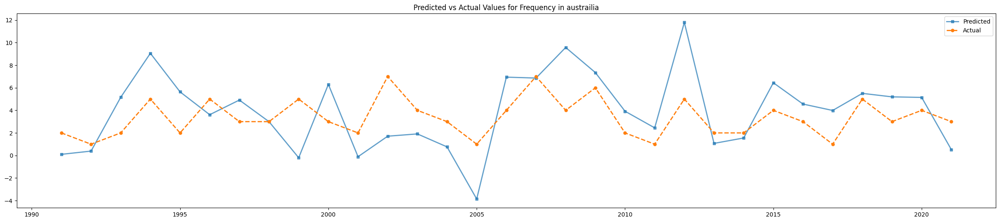

RMSE for y1: 2.718831772437085
Correlation for y1: 0.6051285700755593


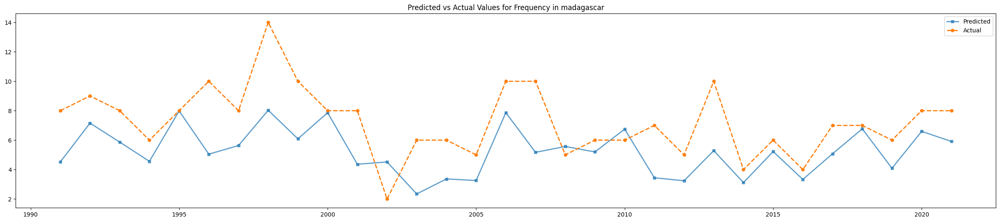

In [ ]:
# Load the predictions from the CSV file
y1_pred_df = pd.read_csv('y_pred_ANN_freq5.csv')

# Plot the predictions and actual values for y1 by country and month
countries = y1_pred_df['country'].unique()

for country in countries:
    country_pred_df = y1_pred_df[y1_pred_df['country'] == country]
    country_pred_df = country_pred_df.groupby('year').agg({'y1_actual': 'sum', 'y1_pred': 'sum'}).reset_index()
    rmse_1 = np.sqrt(mean_squared_error(country_pred_df['y1_actual'], country_pred_df['y1_pred']))
    print("RMSE for y1:", rmse_1)
    corr = country_pred_df['y1_actual'].corr(country_pred_df['y1_pred'])
    print("Correlation for y1:", corr)
    plt.figure(figsize=(30, 6))
    plt.plot(country_pred_df['year'], country_pred_df['y1_pred'], label="Predicted", linewidth=2, linestyle='-', marker='s', markersize=5, alpha=0.7)
    plt.plot(country_pred_df['year'], country_pred_df['y1_actual'], label="Actual", linewidth=2, linestyle='--', marker='o', markersize=5, alpha=1)
    plt.title(f"Predicted vs Actual Values for Frequency in {country}")
    plt.legend()
    plt.show()


RMSE for y2: 61.60831534654279
Correlation for y2: 0.6647292475851762


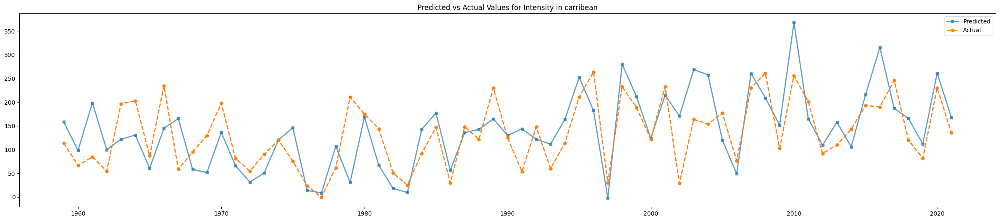

RMSE for y2: 74.21449516535786
Correlation for y2: 0.4941961529840516


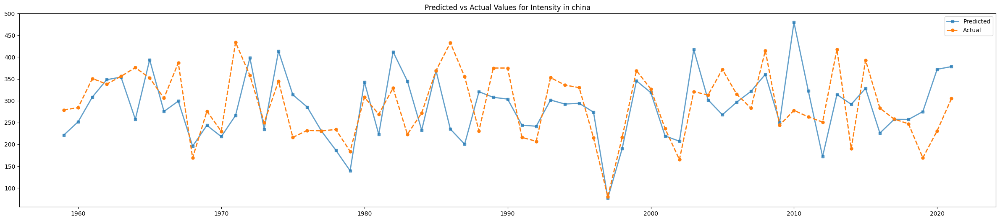

RMSE for y2: 74.55432200000583
Correlation for y2: 0.48588145375713276


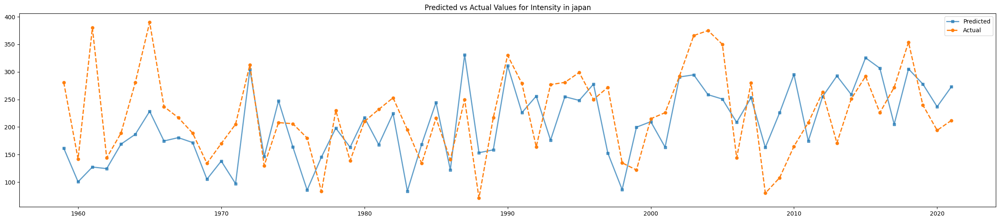

RMSE for y2: 61.69942580869164
Correlation for y2: 0.35869516195130324


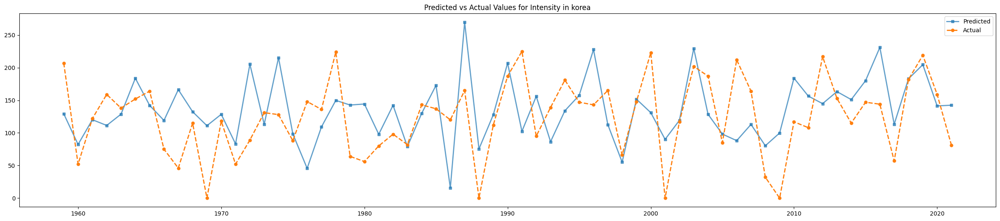

RMSE for y2: 87.63871919124465
Correlation for y2: 0.026304663717882967


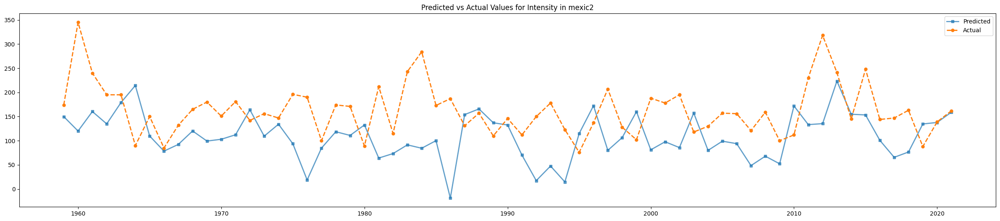

RMSE for y2: 89.43844594137067
Correlation for y2: 0.4571744962797051


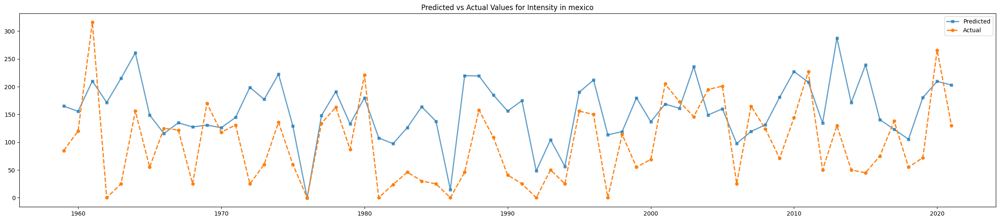

RMSE for y2: 92.76316741911522
Correlation for y2: 0.6936159871839345


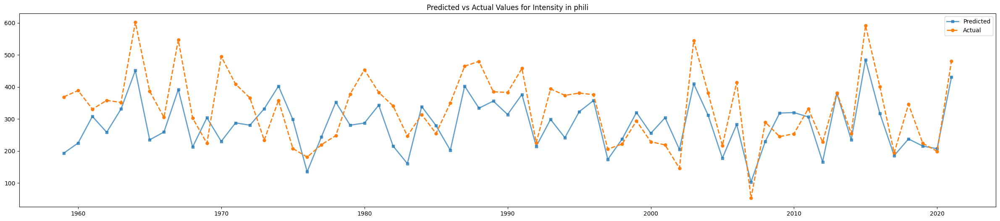

RMSE for y2: 77.33111704342568
Correlation for y2: 0.6175866312827307


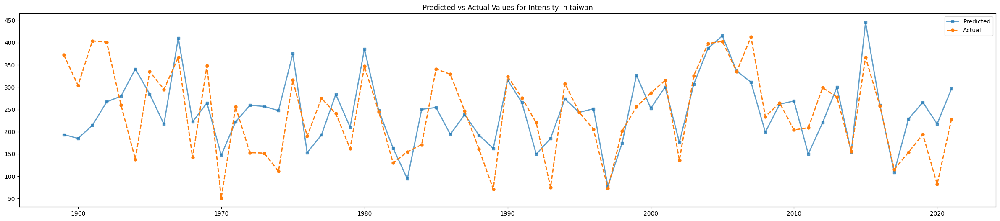

RMSE for y2: 73.63660968304805
Correlation for y2: 0.43209492793882015


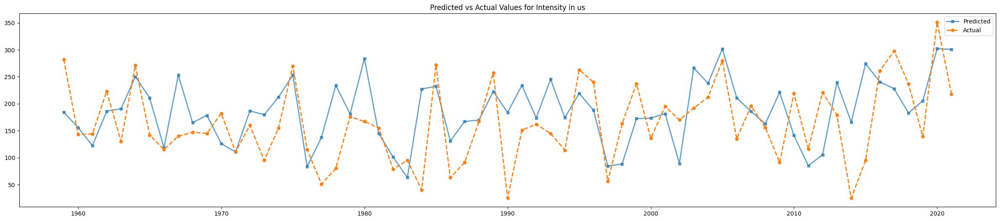

RMSE for y2: 80.30372686803283
Correlation for y2: 0.39693232093015735


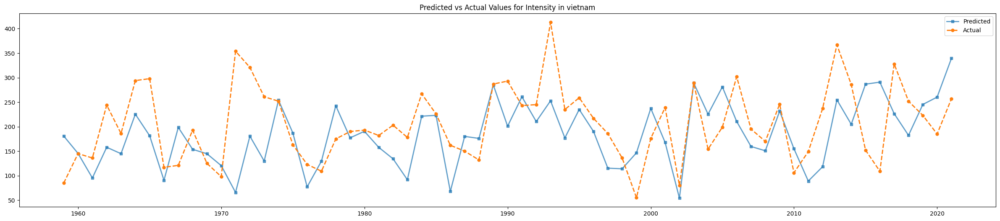

RMSE for y2: 75.84996906638233
Correlation for y2: 0.3094914157721154


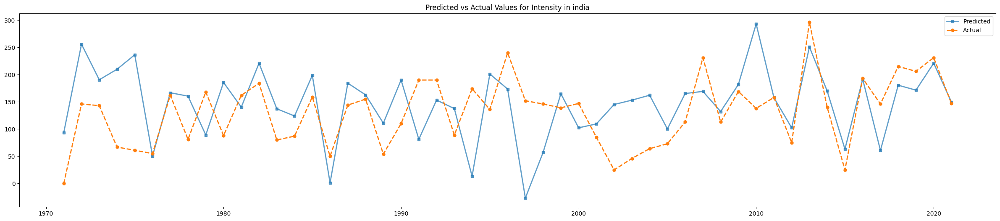

RMSE for y2: 63.13861352719363
Correlation for y2: 0.801788705292791


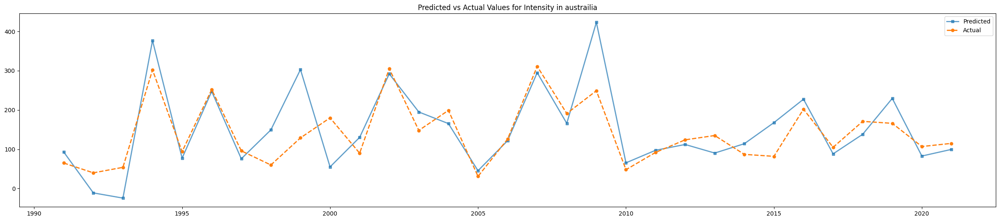

RMSE for y2: 82.38734191732539
Correlation for y2: 0.3581383590141139


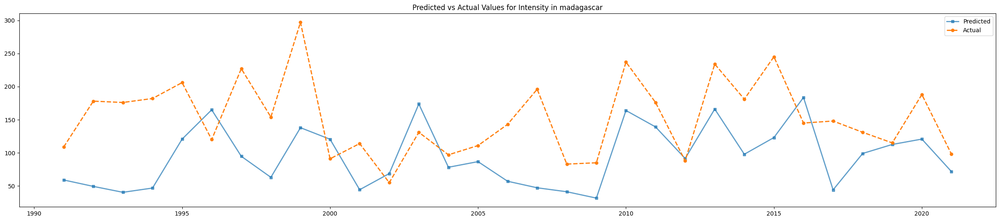

In [5]:
# Load the predictions from the CSV file
y2_pred_df = pd.read_csv('y_pred_ANN_inten5.csv')

# Plot the predictions and actual values for y2 by country and month
countries = y2_pred_df['country'].unique()

for country in countries:
    country_pred_df = y2_pred_df[y2_pred_df['country'] == country]
    country_pred_df = country_pred_df.groupby('year').agg({'y2_actual': 'sum', 'y2_pred': 'sum'}).reset_index()
    rmse_1 = np.sqrt(mean_squared_error(country_pred_df['y2_actual'], country_pred_df['y2_pred']))
    print("RMSE for y2:", rmse_1)
    corr = country_pred_df['y2_actual'].corr(country_pred_df['y2_pred'])
    print("Correlation for y2:", corr)
    plt.figure(figsize=(30, 6))
    plt.plot(country_pred_df['year'], country_pred_df['y2_pred'], label="Predicted", linewidth=2, linestyle='-', marker='s', markersize=5, alpha=0.7)
    plt.plot(country_pred_df['year'], country_pred_df['y2_actual'], label="Actual", linewidth=2, linestyle='--', marker='o', markersize=5, alpha=1)
    plt.title(f"Predicted vs Actual Values for Intensity in {country}")
    plt.legend()
    plt.show()


RMSE for y1: 1.9120613757459928
Correlation for y1: 0.6843072308250936


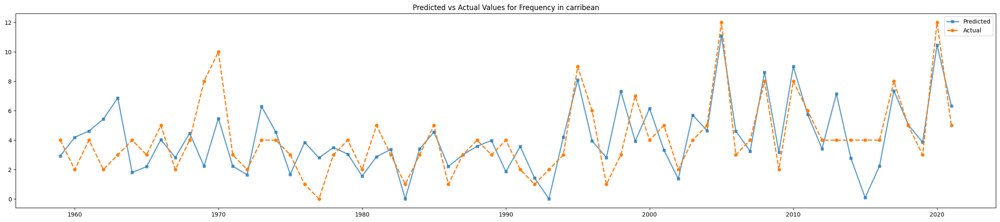

RMSE for y1: 2.0533592093760094
Correlation for y1: 0.6045039278867158


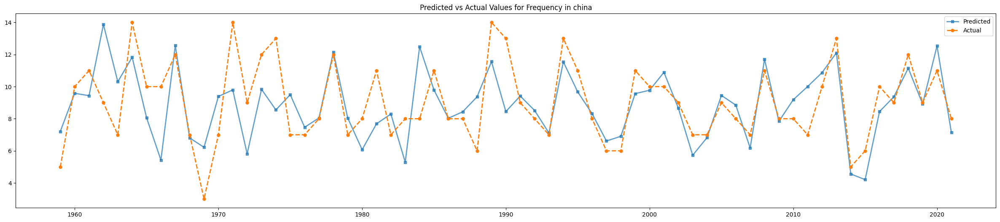

RMSE for y1: 2.5148052017984015
Correlation for y1: 0.6140623454440977


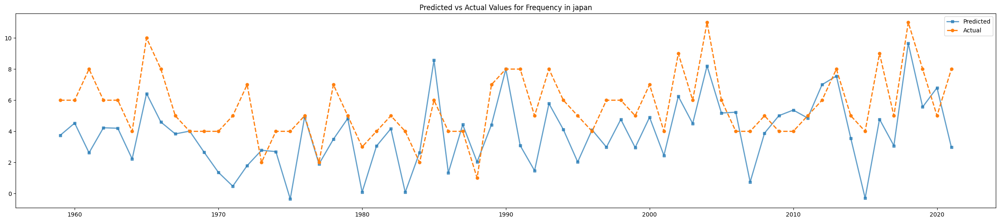

RMSE for y1: 2.1260926206801543
Correlation for y1: 0.48634303806267487


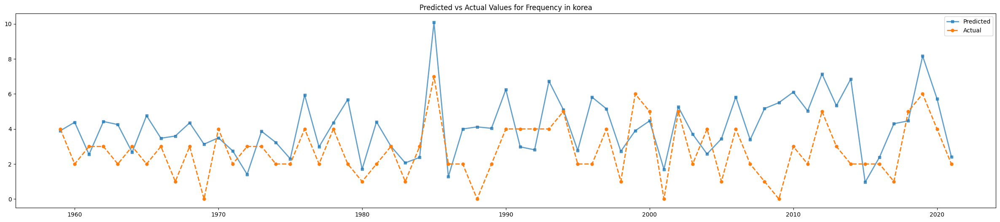

RMSE for y1: 1.9913840009216228
Correlation for y1: 0.6031255710214841


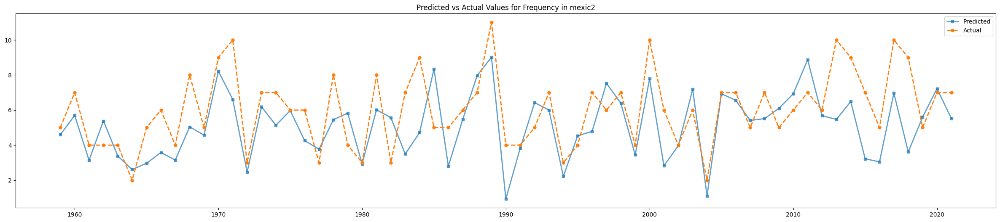

RMSE for y1: 3.2352785396965036
Correlation for y1: 0.6007589072317425


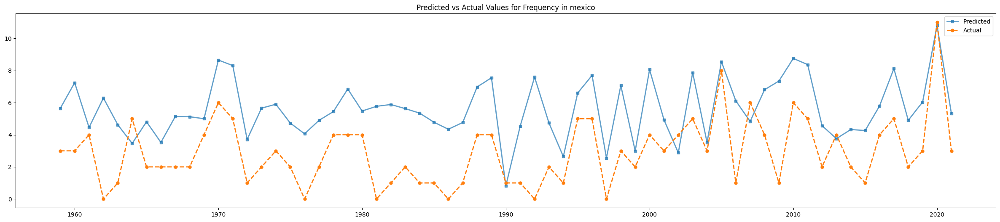

RMSE for y1: 2.8935930406735246
Correlation for y1: 0.616342640477483


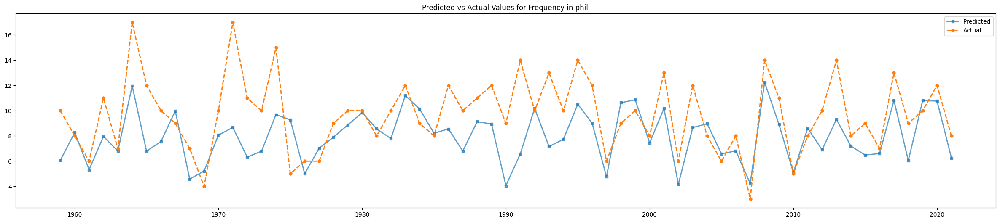

RMSE for y1: 2.053571378069095
Correlation for y1: 0.300477468846448


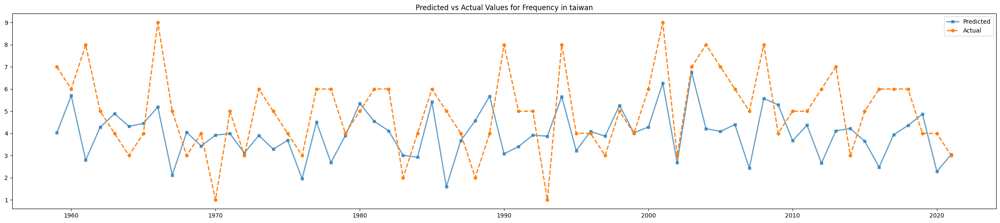

RMSE for y1: 3.37757901622841
Correlation for y1: 0.13232855808867053


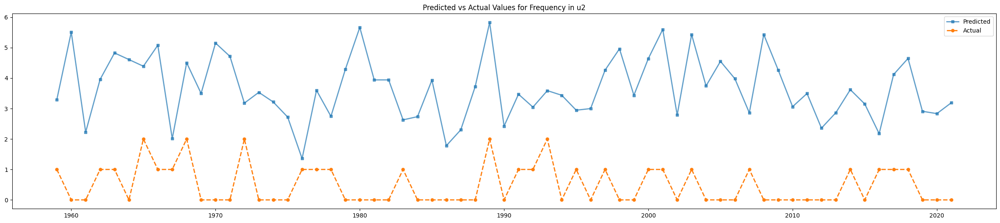

RMSE for y1: 2.5078731312551805
Correlation for y1: 0.38694645574716785


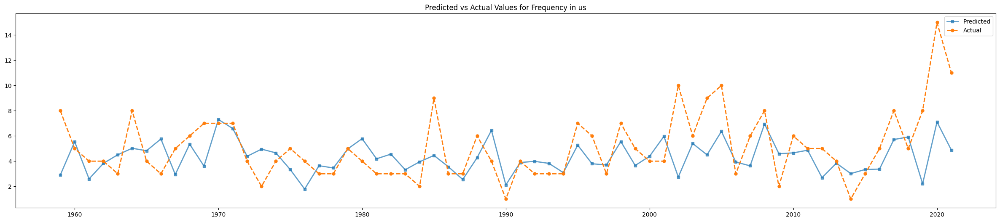

RMSE for y1: 2.256884329929858
Correlation for y1: 0.44297810873750737


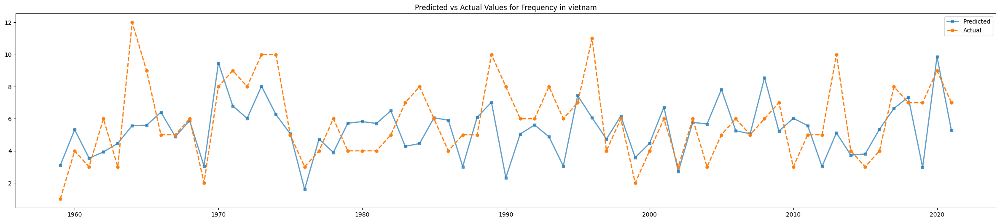

RMSE for y1: 1.3824576863546667
Correlation for y1: 0.4229929130962777


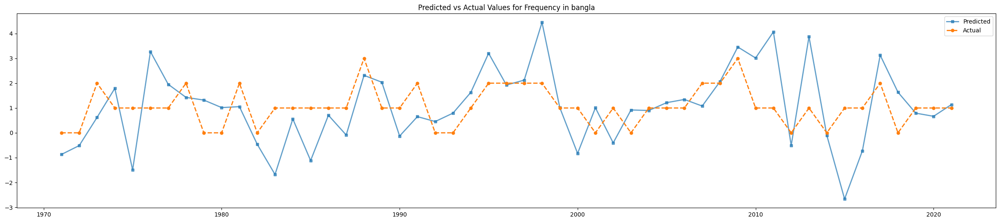

RMSE for y1: 1.795068868794397
Correlation for y1: 0.5250280133198584


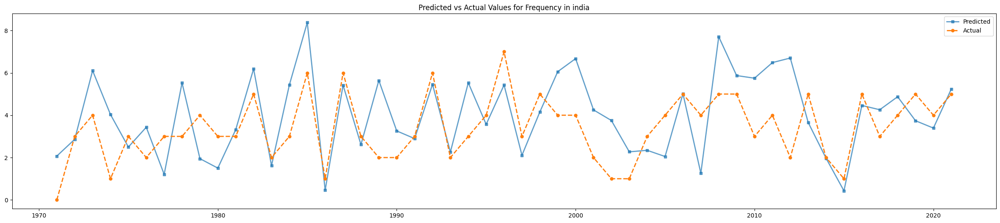

RMSE for y1: 1.9675307037647787
Correlation for y1: 0.35863435730569876


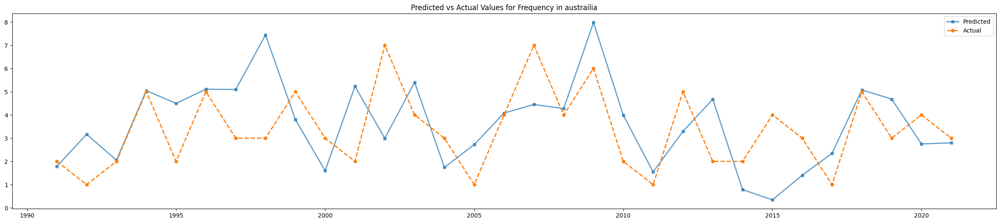

RMSE for y1: 2.6558351661833544
Correlation for y1: 0.35683617411827145


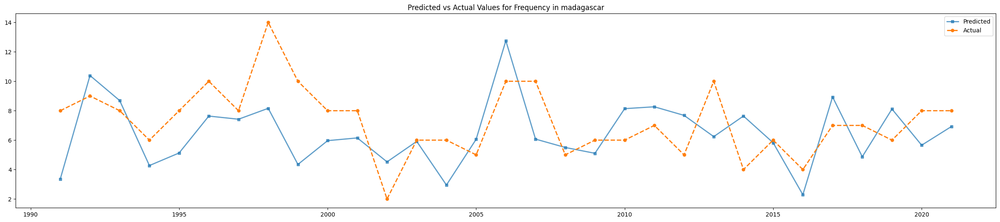

In [6]:
# Load the predictions from the CSV file
y1_pred_df = pd.read_csv('y_pred_ANN_freq4.csv')

# Plot the predictions and actual values for y1 by country and month
countries = y1_pred_df['country'].unique()

for country in countries:
    country_pred_df = y1_pred_df[y1_pred_df['country'] == country]
    country_pred_df = country_pred_df.groupby('year').agg({'y1_actual': 'sum', 'y1_pred': 'sum'}).reset_index()
    rmse_1 = np.sqrt(mean_squared_error(country_pred_df['y1_actual'], country_pred_df['y1_pred']))
    print("RMSE for y1:", rmse_1)
    corr = country_pred_df['y1_actual'].corr(country_pred_df['y1_pred'])
    print("Correlation for y1:", corr)
    plt.figure(figsize=(30, 6))
    plt.plot(country_pred_df['year'], country_pred_df['y1_pred'], label="Predicted", linewidth=2, linestyle='-', marker='s', markersize=5, alpha=0.7)
    plt.plot(country_pred_df['year'], country_pred_df['y1_actual'], label="Actual", linewidth=2, linestyle='--', marker='o', markersize=5, alpha=1)
    plt.title(f"Predicted vs Actual Values for Frequency in {country}")
    plt.legend()
    plt.show()


RMSE for y2: 6.068702325791803
Correlation for y2: 0.5736085269088859


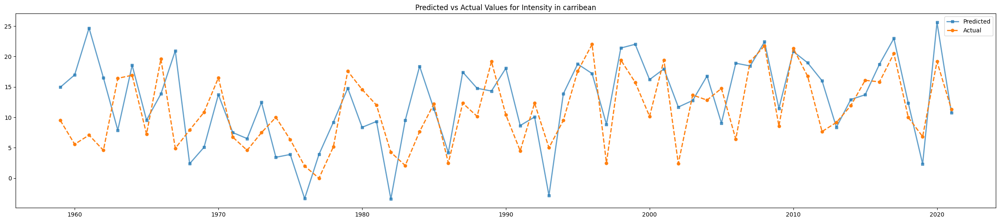

RMSE for y2: 5.2652315694258345
Correlation for y2: 0.5888068108570578


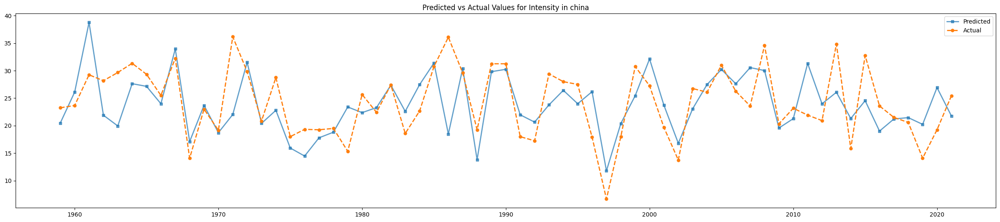

RMSE for y2: 7.7752957772540485
Correlation for y2: 0.4366988868076672


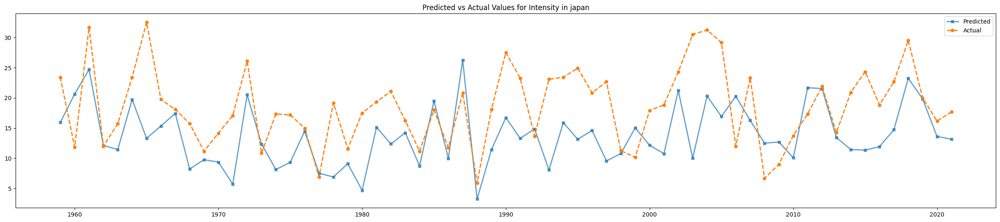

RMSE for y2: 5.907656630055105
Correlation for y2: 0.3434447740488288


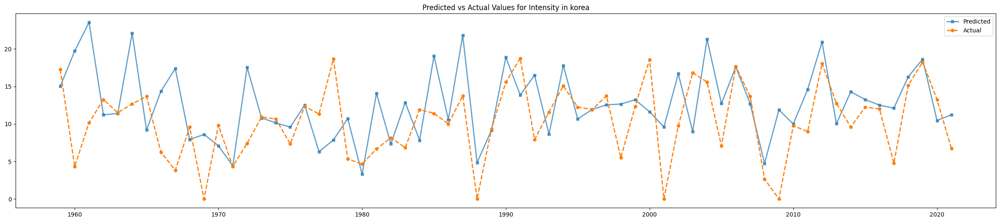

RMSE for y2: 5.387121083198284
Correlation for y2: 0.3197615903113294


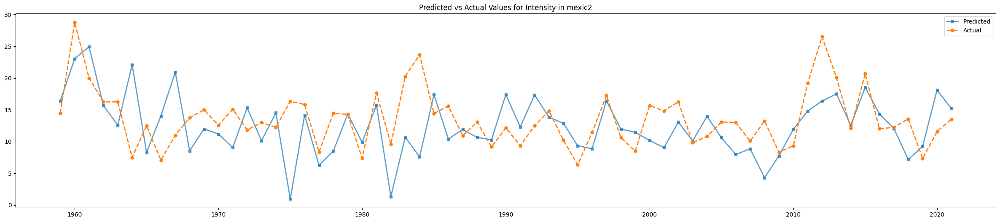

RMSE for y2: 9.612102529165883
Correlation for y2: 0.34106296168891226


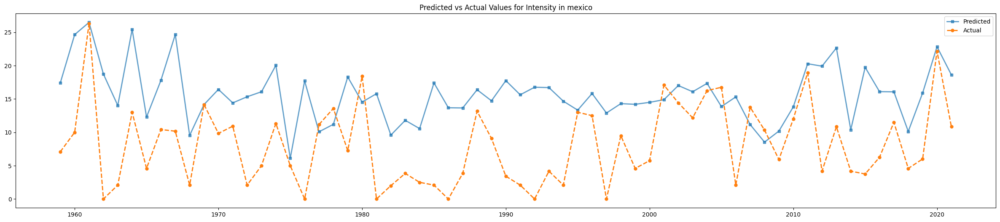

RMSE for y2: 9.71059350957211
Correlation for y2: 0.4471280273532649


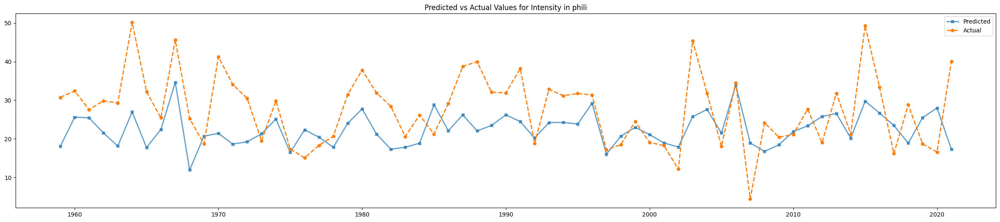

RMSE for y2: 8.921139146252553
Correlation for y2: 0.46262589681415917


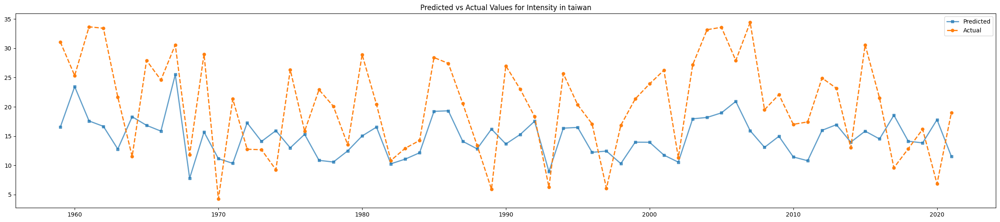

RMSE for y2: 12.63431197854858
Correlation for y2: 0.15692855198323555


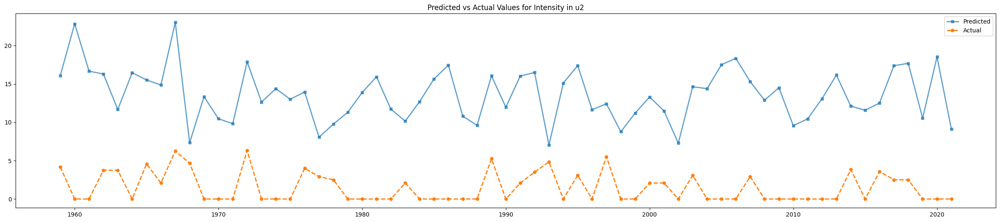

RMSE for y2: 5.92503013590891
Correlation for y2: 0.3303823244266116


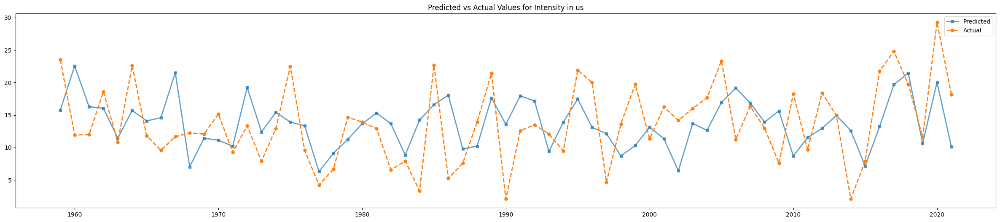

RMSE for y2: 6.972659020763369
Correlation for y2: 0.35500386455916016


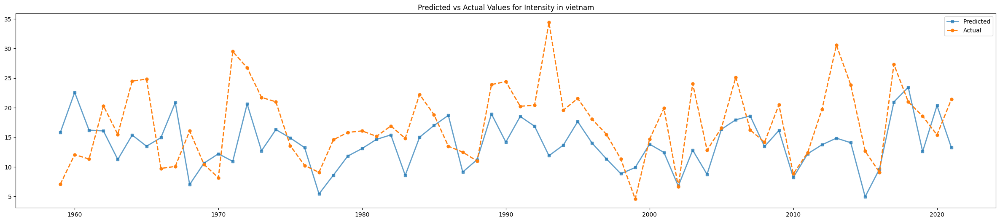

RMSE for y2: 5.503249692423874
Correlation for y2: 0.5072492120054761


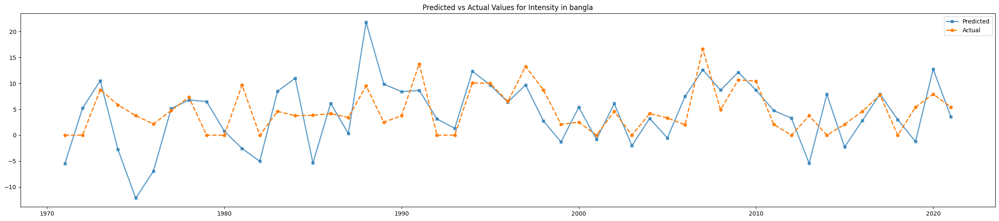

RMSE for y2: 7.142734466962289
Correlation for y2: 0.46780168623758284


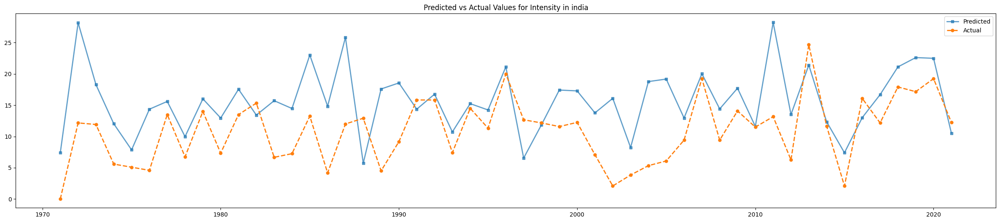

RMSE for y2: 4.404667787756253
Correlation for y2: 0.7997064408028328


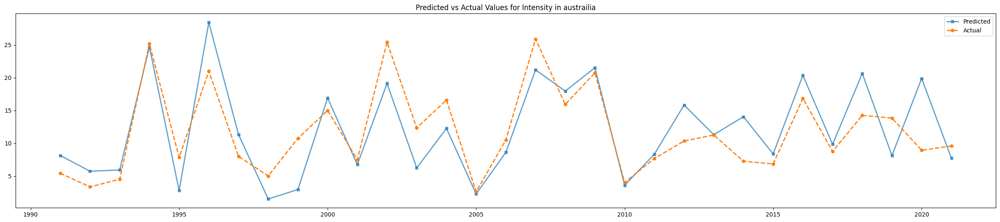

RMSE for y2: 5.243160683161095
Correlation for y2: 0.24388712501615084


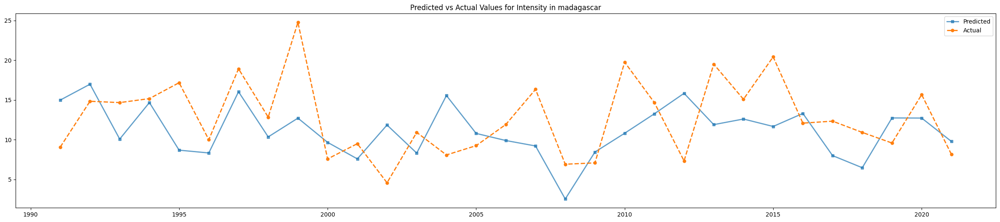

In [7]:
# Load the predictions from the CSV file
y2_pred_df = pd.read_csv('y_pred_ANN_inten4.csv')

# Plot the predictions and actual values for y2 by country and month
countries = y2_pred_df['country'].unique()

for country in countries:
    country_pred_df = y2_pred_df[y2_pred_df['country'] == country]
    country_pred_df = country_pred_df.groupby('year').agg({'y2_actual': 'mean', 'y2_pred': 'mean'}).reset_index()
    rmse_1 = np.sqrt(mean_squared_error(country_pred_df['y2_actual'], country_pred_df['y2_pred']))
    print("RMSE for y2:", rmse_1)
    corr = country_pred_df['y2_actual'].corr(country_pred_df['y2_pred'])
    print("Correlation for y2:", corr)
    plt.figure(figsize=(30, 6))
    plt.plot(country_pred_df['year'], country_pred_df['y2_pred'], label="Predicted", linewidth=2, linestyle='-', marker='s', markersize=5, alpha=0.7)
    plt.plot(country_pred_df['year'], country_pred_df['y2_actual'], label="Actual", linewidth=2, linestyle='--', marker='o', markersize=5, alpha=1)
    plt.title(f"Predicted vs Actual Values for Intensity in {country}")
    plt.legend()
    plt.show()
